In [49]:
#NORMALIZING THE DATASET

import csv
file_path = 'Games.csv'
games_data = []
with open(file_path, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        games_data.append(row)
for idx, game in enumerate(games_data, start=1):
    game['GameID'] = idx
games_table = {}
for game in games_data:
    games_table[game['GameID']] = game['GameName']
reviews_table = {}
review_id = 1
for game in games_data:
    review = game['Review']
    score = game['Score']
    if (review, score) not in reviews_table:
        reviews_table[(review, score)] = review_id
        review_id += 1
game_reviews_table = []
for game in games_data:
    review = game['Review']
    review_id = reviews_table[(review, game['Score'])]
    game_reviews_table.append({
        'GameID': game['GameID'],
        'ReviewID': review_id
    })
consoles_table = {}
console_id = 1
for game in games_data:
    consoles = game['Console'].split(', ')
    for console in consoles:
        if console not in consoles_table:
            consoles_table[console] = console_id
            console_id += 1
game_consoles_table = []
for game in games_data:
    consoles = game['Console'].split(', ')
    for console in consoles:
        console_id = consoles_table[console]
        game_consoles_table.append({
            'GameID': game['GameID'],
            'ConsoleID': console_id
        })
with open('Games_Normalized.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['GameID', 'GameName'])
    for game_id, game_name in games_table.items():
        writer.writerow([game_id, game_name])
with open('Consoles_Normalized.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['ConsoleID', 'ConsoleName'])
    for console, console_id in consoles_table.items():
        writer.writerow([console_id, console])
with open('Game_Consoles_Normalized.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['GameID', 'ConsoleID'])
    for row in game_consoles_table:
        writer.writerow([row['GameID'], row['ConsoleID']])
with open('Reviews_Normalized.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['ReviewID', 'Review', 'Score'])
    for (review, score), review_id in reviews_table.items():
        writer.writerow([review_id, review, score])
print("Games Table:")
for idx, (game_id, game_name) in enumerate(games_table.items()):
    if idx < 5:
        print(f'{game_id}: {game_name}')
print("\nConsoles Table:")
for idx, (console_name, console_id) in enumerate(consoles_table.items()):
    if idx < 5:
        print(f'{console_id}: {console_name}')
print("\nGame-Consoles Table:")
for idx, row in enumerate(game_consoles_table):
    if idx < 5:
        print(f'GameID: {row["GameID"]}, ConsoleID: {row["ConsoleID"]}')
print("\nReviews Table:")
for idx, ((review, score), review_id) in enumerate(reviews_table.items()):
    if idx < 5:
        print(f'ReviewID: {review_id}, Review: {review}, Score: {score}')


Games Table:
1: Baldur's Gate 3 Early Access Review
2: Control: Ultimate Edition Cloud Version Review
3: Doom Eternal: The Ancient Gods Part 1 Review
4: Watch Dogs: Legion Review
5: Ring Of Pain Review

Consoles Table:
1: PC
2: NS
3: XONE
4: PS4
5: IOS

Game-Consoles Table:
GameID: 1, ConsoleID: 1
GameID: 2, ConsoleID: 2
GameID: 3, ConsoleID: 3
GameID: 3, ConsoleID: 1
GameID: 3, ConsoleID: 4

Reviews Table:
ReviewID: 1, Review: Early Access, Score: 6
ReviewID: 2, Review: Good, Score: 7
ReviewID: 3, Review: Great, Score: 8
ReviewID: 4, Review: Superb, Score: 9
ReviewID: 5, Review: Fair, Score: 6


In [50]:
#JOINING THE DATASET USING SQL

import sqlite3
import csv

conn = sqlite3.connect('game_database.db')
cursor = conn.cursor()

cursor.execute('DROP TABLE IF EXISTS games')
cursor.execute('DROP TABLE IF EXISTS consoles')
cursor.execute('DROP TABLE IF EXISTS game_consoles')
cursor.execute('DROP TABLE IF EXISTS reviews')

cursor.execute('''
CREATE TABLE IF NOT EXISTS games (
    GameID INTEGER PRIMARY KEY,
    GameName TEXT
)
''')

cursor.execute('''
CREATE TABLE IF NOT EXISTS consoles (
    ConsoleID INTEGER PRIMARY KEY,
    ConsoleName TEXT
)
''')

cursor.execute('''
CREATE TABLE IF NOT EXISTS game_consoles (
    GameID INTEGER,
    ConsoleID INTEGER,
    FOREIGN KEY(GameID) REFERENCES games(GameID),
    FOREIGN KEY(ConsoleID) REFERENCES consoles(ConsoleID)
)
''')

cursor.execute('''
CREATE TABLE IF NOT EXISTS reviews (
    ReviewID INTEGER PRIMARY KEY,
    GameID INTEGER,
    Review TEXT,
    Score INTEGER,
    FOREIGN KEY(GameID) REFERENCES games(GameID)
)
''')

def load_csv_to_sql(csv_file, table_name, column_mapping):
    with open(csv_file, newline='', encoding='utf-8') as f:
        reader = csv.DictReader(f)
        for row in reader:
            mapped_row = {column_mapping[key]: value for key, value in row.items()}
            columns = ', '.join(mapped_row.keys())
            placeholders = ', '.join(['?'] * len(mapped_row))
            sql = f"INSERT INTO {table_name} ({columns}) VALUES ({placeholders})"
            cursor.execute(sql, tuple(mapped_row.values()))

games_mapping = {'GameID': 'GameID', 'GameName': 'GameName'}
consoles_mapping = {'ConsoleID': 'ConsoleID', 'ConsoleName': 'ConsoleName'}
game_consoles_mapping = {'GameID': 'GameID', 'ConsoleID': 'ConsoleID'}
reviews_mapping = {'ReviewID': 'ReviewID', 'GameID': 'GameID', 'Review': 'Review', 'Score': 'Score'}

load_csv_to_sql('Games_Normalized.csv', 'games', games_mapping)
load_csv_to_sql('Consoles_Normalized.csv', 'consoles', consoles_mapping)
load_csv_to_sql('Game_Consoles_Normalized.csv', 'game_consoles', game_consoles_mapping)
load_csv_to_sql('Reviews_Normalized.csv', 'reviews', reviews_mapping)

conn.commit()

cursor.execute('''
SELECT
    g.GameID,
    g.GameName,
    c.ConsoleName,
    r.ReviewID,
    r.Review,
    r.Score
FROM
    game_consoles gc
JOIN
    games g ON g.GameID = gc.GameID
JOIN
    consoles c ON c.ConsoleID = gc.ConsoleID
LEFT JOIN
    reviews r ON r.GameID = g.GameID
LIMIT 1000;
''')

result = cursor.fetchall()
for row in result:
    print(row)

conn.close()


(1, "Baldur's Gate 3 Early Access Review", 'PC', None, None, None)
(2, 'Control: Ultimate Edition Cloud Version Review', 'NS', None, None, None)
(3, 'Doom Eternal: The Ancient Gods Part 1 Review', 'XONE', None, None, None)
(3, 'Doom Eternal: The Ancient Gods Part 1 Review', 'PC', None, None, None)
(3, 'Doom Eternal: The Ancient Gods Part 1 Review', 'PS4', None, None, None)
(4, 'Watch Dogs: Legion Review', 'XONE', None, None, None)
(4, 'Watch Dogs: Legion Review', 'PC', None, None, None)
(4, 'Watch Dogs: Legion Review', 'PS4', None, None, None)
(5, 'Ring Of Pain Review', 'PC', None, None, None)
(6, 'Pikmin 3 Deluxe Review', 'NS', None, None, None)
(7, 'Ghostrunner Review', 'PC', None, None, None)
(7, 'Ghostrunner Review', 'XONE', None, None, None)
(7, 'Ghostrunner Review', 'PS4', None, None, None)
(8, 'Disc Room Review – Getting Buzzed', 'PC', None, None, None)
(8, 'Disc Room Review – Getting Buzzed', 'NS', None, None, None)
(9, 'NHL 21 Review', 'XONE', None, None, None)
(9, 'NHL 21 Rev

In [51]:
#SPLITTING THE DATASET INTO TEST AND TRAIN SET

import sqlite3
import random

conn = sqlite3.connect('game_database.db')
cursor = conn.cursor()

cursor.execute('''
SELECT g.GameID, g.GameName, c.ConsoleName, r.ReviewID, r.Review, r.Score
FROM game_consoles gc
JOIN games g ON g.GameID = gc.GameID
JOIN consoles c ON c.ConsoleID = gc.ConsoleID
LEFT JOIN reviews r ON r.GameID = g.GameID;
''')

data = cursor.fetchall()

train_size = int(len(data) * 0.8)
test_size = len(data) - train_size

random.shuffle(data)
train_data = data[:train_size]
test_data = data[train_size:]

print("Training Data (first 5 records):", train_data[:5])
print("Testing Data (first 5 records):", test_data[:5])

cursor.execute('DROP TABLE IF EXISTS train_data')
cursor.execute('''
CREATE TABLE IF NOT EXISTS train_data (
    GameID INTEGER,
    GameName TEXT,
    ConsoleName TEXT,
    ReviewID INTEGER,
    Review TEXT,
    Score INTEGER
)
''')

cursor.execute('DROP TABLE IF EXISTS test_data')
cursor.execute('''
CREATE TABLE IF NOT EXISTS test_data (
    GameID INTEGER,
    GameName TEXT,
    ConsoleName TEXT,
    ReviewID INTEGER,
    Review TEXT,
    Score INTEGER
)
''')

cursor.executemany('''
INSERT INTO train_data (GameID, GameName, ConsoleName, ReviewID, Review, Score)
VALUES (?, ?, ?, ?, ?, ?)
''', train_data)

cursor.executemany('''
INSERT INTO test_data (GameID, GameName, ConsoleName, ReviewID, Review, Score)
VALUES (?, ?, ?, ?, ?, ?)
''', test_data)

conn.commit()
conn.close()


Training Data (first 5 records): [(4043, "Assassin's Creed II: Discovery Review", 'DS', None, None, None), (600, 'Rumu Review', 'PC', None, None, None), (12972, "NBA In The Zone '98 Review", 'PS', None, None, None), (11588, 'The Simpsons Skateboarding Review', 'PS2', None, None, None), (11094, 'Mario Golf: Toadstool Tour Review', 'GC', None, None, None)]
Testing Data (first 5 records): [(7721, 'Empire of the Ants Review', 'PC', None, None, None), (5730, 'Silent Debuggers Review', 'TG16', None, None, None), (2247, 'Far Cry 3 Review', 'X360', None, None, None), (14672, 'Age of Empires Review', 'PC', None, None, None), (13095, 'Riven: The Sequel to Myst Review', 'PS', None, None, None)]


In [52]:
conn = sqlite3.connect('game_database.db')
cursor = conn.cursor()

cursor.execute('SELECT COUNT(*) FROM games WHERE GameID IS NULL OR GameName IS NULL')
games_missing = cursor.fetchone()

cursor.execute('SELECT COUNT(*) FROM consoles WHERE ConsoleID IS NULL OR ConsoleName IS NULL')
consoles_missing = cursor.fetchone()

cursor.execute('SELECT COUNT(*) FROM game_consoles WHERE GameID IS NULL OR ConsoleID IS NULL')
game_consoles_missing = cursor.fetchone()

cursor.execute('SELECT COUNT(*) FROM reviews WHERE ReviewID IS NULL OR GameID IS NULL OR Review IS NULL OR Score IS NULL')
reviews_missing = cursor.fetchone()

print(f"Missing in games table: {games_missing}")
print(f"Missing in consoles table: {consoles_missing}")
print(f"Missing in game_consoles table: {game_consoles_missing}")
print(f"Missing in reviews table: {reviews_missing}")

conn.close()


Missing in games table: (0,)
Missing in consoles table: (0,)
Missing in game_consoles table: (0,)
Missing in reviews table: (12,)


In [53]:
conn = sqlite3.connect('game_database.db')
cursor = conn.cursor()
cursor.execute('SELECT COUNT(*) FROM reviews WHERE Score < 0 OR Score > 10')
outliers_score = cursor.fetchone()
print(f"Outliers in reviews (score < 0 or > 10): {outliers_score[0]}")
conn.close()


Outliers in reviews (score < 0 or > 10): 0


   ReviewID GameID        Review  Score
0         1   None  Early Access      6
1         2   None          Good      7
2         3   None         Great      8
3         4   None        Superb      9
4         5   None          Fair      6


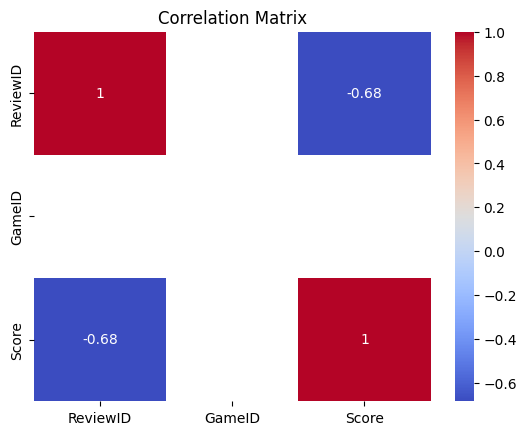

In [54]:
#PERFORMING DATA CLEANUP AND OBTAINING A CORRELATION MATRIX

import sqlite3
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
conn = sqlite3.connect('game_database.db')
cursor = conn.cursor()
query = 'SELECT * FROM reviews'
df_reviews = pd.read_sql(query, conn)
print(df_reviews.head())
df_reviews_numeric = df_reviews.drop(columns=['Review'])
correlation_matrix = df_reviews_numeric.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()
conn.close()


In [55]:
!pip install scikit-learn mlflow dagsHub
!pip install imbalanced-learn

In [56]:
import mlflow
if mlflow.active_run():
  mlflow.end_run()
mlflow.start_run()


<ActiveRun: >

In [57]:
#EXPERIMENT 1

import json
import mlflow
import mlflow.sklearn
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from sklearn.impute import SimpleImputer


df = pd.read_csv("Games.csv")

X = df.drop('Score', axis=1)
y = df['Score']

numeric_features = X.select_dtypes(include=['int64', 'float64']).columns

for col in numeric_features:
    X[col] = np.log1p(X[col].clip(lower=0))

if 'Score' in X.columns:
    X['Score_log'] = np.log1p(X['Score'].clip(lower=0))

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(max_iter=500))
])

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
param_grid = {'classifier__C': [0.1, 1, 10]}
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='f1_macro', n_jobs=-1, verbose=1)

grid_search.fit(X_train, y_train)

mlflow.log_param('best_params', grid_search.best_params_)

mean_f1 = grid_search.best_score_
mlflow.log_metric('mean_f1_cv', mean_f1)

y_test_pred = grid_search.predict(X_test)
f1_test = f1_score(y_test, y_test_pred, average='macro')
mlflow.log_metric('f1_test', f1_test)

report = classification_report(y_test, y_test_pred, output_dict=True)
mlflow.log_param('classification_report', json.dumps(report))

cm = confusion_matrix(y_test, y_test_pred)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        mlflow.log_metric(f'confusion_matrix_{i}_{j}', cm[i, j])

mlflow.end_run()

print(f"Mean F1-score (CV): {mean_f1}")
print(f"F1-score (test data): {f1_test}")


Fitting 3 folds for each of 3 candidates, totalling 9 fits
Mean F1-score (CV): 0.9998773833824499
F1-score (test data): 1.0


In [62]:
import mlflow
if mlflow.active_run():
  mlflow.end_run()
mlflow.start_run()

<ActiveRun: >

In [59]:
!pip install --upgrade scikit-learn

In [65]:
#EXPERIMENT 2

import json
import mlflow
import mlflow.sklearn
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV
import xgboost as xgb

# End any existing runs
mlflow.end_run()

df = pd.read_csv("Games.csv")

X = df.drop('Score', axis=1)
y = df['Score']

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

classifiers = {
    'Logistic Regression': {
        'model': LogisticRegression(max_iter=1000),
        'params': {
            'classifier__C': [0.1, 1, 10],
            'classifier__penalty': ['l2']
        }
    },
    'Ridge Classifier': {
        'model': RidgeClassifier(),
        'params': {
            'classifier__alpha': [0.1, 1, 10]
        }
    },
    'Random Forest': {
        'model': RandomForestClassifier(),
        'params': {
            'classifier__n_estimators': [50, 100],
            'classifier__max_depth': [10, 20],
            'classifier__min_samples_split': [2, 5]
        }
    },
    'XGBoost': {
        'model': xgb.XGBClassifier(),
        'params': {
            'classifier__learning_rate': [0.01, 0.1],
            'classifier__max_depth': [3, 6],
            'classifier__n_estimators': [50, 100]
        }
    }
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

mlflow.set_experiment("classification_experiment")

try:
    with mlflow.start_run(run_name="main_run"):
        for name, clf_info in classifiers.items():
            with mlflow.start_run(run_name=name, nested=True):
                print(f"\nTraining {name}")

                pipeline = Pipeline([
                    ('preprocessor', preprocessor),
                    ('classifier', clf_info['model'])
                ])

                grid_search = GridSearchCV(
                    pipeline,
                    clf_info['params'],
                    cv=cv,
                    scoring='f1_weighted',
                    n_jobs=-1,
                    verbose=1
                )

                try:
                    grid_search.fit(X_train, y_train)

                    mlflow.log_params(grid_search.best_params_)

                    y_train_pred = grid_search.predict(X_train)
                    y_test_pred = grid_search.predict(X_test)

                    metrics = {
                        'train_f1': f1_score(y_train, y_train_pred, average='weighted'),
                        'test_f1': f1_score(y_test, y_test_pred, average='weighted'),
                    }

                    mlflow.log_metrics(metrics)

                    train_cm = confusion_matrix(y_train, y_train_pred)
                    test_cm = confusion_matrix(y_test, y_test_pred)

                    np.savetxt(f'{name}_train_cm.txt', train_cm)
                    np.savetxt(f'{name}_test_cm.txt', test_cm)
                    mlflow.log_artifact(f'{name}_train_cm.txt')
                    mlflow.log_artifact(f'{name}_test_cm.txt')

                    mlflow.sklearn.log_model(
                        grid_search.best_estimator_,
                        f"{name}_model",
                        registered_model_name=name
                    )

                    print(f"{name} Results:")
                    print(f"Best parameters: {grid_search.best_params_}")
                    print(f"Train F1: {metrics['train_f1']:.4f}")
                    print(f"Test F1: {metrics['test_f1']:.4f}")

                except Exception as e:
                    print(f"Error training {name}: {str(e)}")
                    continue
finally:
    mlflow.end_run()

print("\nExperiment completed. Check MLflow UI for detailed results.")


Training Logistic Regression
Fitting 5 folds for each of 3 candidates, totalling 15 fits


2024/12/20 22:09:20 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'Logistic Regression' already exists. Creating a new version of this model...
Created version '3' of model 'Logistic Regression'.


Logistic Regression Results:
Best parameters: {'classifier__C': 1, 'classifier__penalty': 'l2'}
Train F1: 1.0000
Test F1: 1.0000

Training Ridge Classifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits


2024/12/20 22:09:35 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'Ridge Classifier' already exists. Creating a new version of this model...
Created version '3' of model 'Ridge Classifier'.


Ridge Classifier Results:
Best parameters: {'classifier__alpha': 0.1}
Train F1: 1.0000
Test F1: 1.0000

Training Random Forest
Fitting 5 folds for each of 8 candidates, totalling 40 fits


2024/12/20 22:10:02 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'Random Forest' already exists. Creating a new version of this model...
Created version '3' of model 'Random Forest'.
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The XGBClassifier or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(


Random Forest Results:
Best parameters: {'classifier__max_depth': 20, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 100}
Train F1: 0.9646
Test F1: 0.9637

Training XGBoost
Fitting 5 folds for each of 8 candidates, totalling 40 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1107: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan]
  warnings.warn(


Error training XGBoost: 'super' object has no attribute '__sklearn_tags__'

Experiment completed. Check MLflow UI for detailed results.


/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The XGBClassifier or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The XGBClassifier or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags

In [66]:
from mlflow.tracking import MlflowClient
client = MlflowClient()
experiment = client.get_experiment_by_name("classification_experiment")
runs = client.search_runs(experiment.experiment_id)
for run in runs:
    print(f"Run ID: {run.info.run_id}")
    print(f"Metrics: {run.data.metrics}")
    print(f"Parameters: {run.data.params}")
    print("---")

Run ID: 04d74e098f674a7881f2b307b29ceeb6
Metrics: {}
Parameters: {'classifier__n_estimators': '50', 'classifier__learning_rate': '0.01', 'classifier__max_depth': '3'}
---
Run ID: d37591d51e2d43298a87e62e20ea997a
Metrics: {'train_f1': 0.9645957888774384, 'test_f1': 0.9636738325062925}
Parameters: {'classifier__n_estimators': '100', 'classifier__min_samples_split': '2', 'classifier__max_depth': '20'}
---
Run ID: 7eb442794ee143dcb9597a1a00b02fd5
Metrics: {'train_f1': 1.0, 'test_f1': 1.0}
Parameters: {'classifier__alpha': '0.1'}
---
Run ID: 4e4071303ade4a948e51f281ce53c8e3
Metrics: {'train_f1': 1.0, 'test_f1': 1.0}
Parameters: {'classifier__C': '1', 'classifier__penalty': 'l2'}
---
Run ID: 5f4ee01f02184f328c571dcc99106a15
Metrics: {}
Parameters: {}
---
Run ID: 52892ec0a6004436aaa2035b5dddb882
Metrics: {}
Parameters: {}
---
Run ID: b21e944b8298472895425a8d8f282346
Metrics: {}
Parameters: {}
---
Run ID: 63ec98aa976c45e587858d9909b8cd08
Metrics: {}
Parameters: {}
---
Run ID: 9f81904101ba4baab

In [67]:
import mlflow
if mlflow.active_run():
  mlflow.end_run()
mlflow.start_run()

<ActiveRun: >

In [68]:
#EXPERIMENT 3

import mlflow
import mlflow.sklearn
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.impute import SimpleImputer
from sklearn.metrics import f1_score, confusion_matrix, classification_report
import json
import re

if mlflow.active_run():
    mlflow.end_run()

df = pd.read_csv("Games.csv")
X = df.drop('Score', axis=1)
y = df['Score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

poly_transformer = Pipeline(steps=[
    ('poly', PolynomialFeatures(degree=2, include_bias=False)),
    ('scaler', StandardScaler())
])

preprocessor_with_poly = ColumnTransformer(
    transformers=[
        ('num', poly_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

classifiers = {
    'LogisticRegression': {
        'model': LogisticRegression(max_iter=1000),
        'params': {
            'classifier__C': [0.1, 1, 10],
            'classifier__penalty': ['l2', 'none']
        }
    },
    'RidgeClassifier': {
        'model': RidgeClassifier(),
        'params': {
            'classifier__alpha': [0.1, 1, 10]
        }
    },
    'RandomForestClassifier': {
        'model': RandomForestClassifier(),
        'params': {
            'classifier__n_estimators': [50, 100],
            'classifier__max_depth': [10, 20]
        }
    },
    'XGBClassifier': {
        'model': xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss'),
        'params': {
            'classifier__max_depth': [3, 6, 9],
            'classifier__learning_rate': [0.01, 0.1, 0.2]
        }
    }
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

experiment_name = "model_comparison_experiment"
try:
    experiment = mlflow.get_experiment_by_name(experiment_name)
    if experiment is None:
        experiment_id = mlflow.create_experiment(experiment_name)
    else:
        experiment_id = experiment.experiment_id
except Exception as e:
    print(f"Error setting up experiment: {str(e)}")
    experiment_id = "0"

with mlflow.start_run(experiment_id=experiment_id, run_name="model_comparison") as main_run:
    for classifier_name, clf_info in classifiers.items():
        with mlflow.start_run(run_name=classifier_name, nested=True) as run:
            print(f"\nTraining {classifier_name}")

            pipeline = Pipeline([
                ('preprocessor', preprocessor_with_poly),
                ('classifier', clf_info['model'])
            ])

            grid_search = GridSearchCV(
                pipeline,
                clf_info['params'],
                cv=cv,
                scoring='f1_weighted',
                n_jobs=-1,
                verbose=1
            )

            try:
                grid_search.fit(X_train, y_train)

                mlflow.log_params(grid_search.best_params_)

                y_train_pred = grid_search.predict(X_train)
                y_test_pred = grid_search.predict(X_test)

                train_report = classification_report(y_train, y_train_pred, output_dict=True)
                test_report = classification_report(y_test, y_test_pred, output_dict=True)

                for label, metrics in train_report.items():
                    if isinstance(metrics, dict):
                        for metric_name, value in metrics.items():
                            mlflow.log_metric(f"train_{label}_{metric_name}", value)

                for label, metrics in test_report.items():
                    if isinstance(metrics, dict):
                        for metric_name, value in metrics.items():
                            mlflow.log_metric(f"test_{label}_{metric_name}", value)

                train_cm = confusion_matrix(y_train, y_train_pred)
                test_cm = confusion_matrix(y_test, y_test_pred)

                np.savetxt(f'train_cm_{classifier_name}.txt', train_cm)
                np.savetxt(f'test_cm_{classifier_name}.txt', test_cm)

                mlflow.log_artifact(f'train_cm_{classifier_name}.txt')
                mlflow.log_artifact(f'test_cm_{classifier_name}.txt')

                mlflow.sklearn.log_model(
                    grid_search.best_estimator_,
                    f"{classifier_name}_model"
                )

                print(f"\n{classifier_name} Results:")
                print(f"Best parameters: {grid_search.best_params_}")
                print(f"Train F1 (weighted): {train_report['weighted avg']['f1-score']:.4f}")
                print(f"Test F1 (weighted): {test_report['weighted avg']['f1-score']:.4f}")

            except Exception as e:
                print(f"Error training {classifier_name}: {str(e)}")
                continue

print("\nExperiment completed. All results have been logged to MLflow.")

client = mlflow.tracking.MlflowClient()
for run in client.search_runs([experiment_id]):
    if run.data.tags.get('mlflow.runName') != 'model_comparison':
        print(f"\nClassifier: {run.data.tags.get('mlflow.runName')}")
        print("Best metrics:")
        print(f"Train F1: {run.data.metrics.get('train_weighted avg_f1-score', 'N/A'):.4f}")
        print(f"Test F1: {run.data.metrics.get('test_weighted avg_f1-score', 'N/A'):.4f}")



Training LogisticRegression
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
11 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 660, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "/usr/local/lib/pyth


LogisticRegression Results:
Best parameters: {'classifier__C': 1, 'classifier__penalty': 'l2'}
Train F1 (weighted): 1.0000
Test F1 (weighted): 1.0000

Training RidgeClassifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits


2024/12/20 22:15:45 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.



RidgeClassifier Results:
Best parameters: {'classifier__alpha': 0.1}
Train F1 (weighted): 1.0000
Test F1 (weighted): 1.0000

Training RandomForestClassifier
Fitting 5 folds for each of 4 candidates, totalling 20 fits


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/m


RandomForestClassifier Results:
Best parameters: {'classifier__max_depth': 20, 'classifier__n_estimators': 100}
Train F1 (weighted): 0.9195
Test F1 (weighted): 0.9150

Training XGBClassifier
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Error training XGBClassifier: 
All the 45 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
45 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", li

In [69]:
import mlflow
if mlflow.active_run():
  mlflow.end_run()
mlflow.start_run()

<ActiveRun: >

In [70]:
#EXPERIMENT 4

import mlflow
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

if mlflow.active_run():
    mlflow.end_run()

with mlflow.start_run(run_name="data_preprocessing"):
    df = pd.read_csv("Games.csv")
    mlflow.log_param('initial_shape', str(df.shape))

    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
    categorical_cols = df.select_dtypes(include=['object']).columns

    processed_df = df.copy()
    encoding_mapping = {}

    for col in categorical_cols:
        le = LabelEncoder()
        processed_df[col] = le.fit_transform(df[col].astype(str))
        encoding_mapping[col] = dict(zip(le.classes_, le.transform(le.classes_)))

    mlflow.log_param('categorical_encodings', str(encoding_mapping))

    correlation_matrix = processed_df[numeric_cols].corr().abs()

    upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

    to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

    mlflow.log_param('dropped_features', str(to_drop))

    final_df = processed_df.drop(columns=to_drop)

    mlflow.log_param('final_shape', str(final_df.shape))
    mlflow.log_param('final_features', str(list(final_df.columns)))

    X = final_df.drop('Score', axis=1)
    y = final_df['Score']

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    mlflow.log_params({
        'train_size': X_train.shape[0],
        'test_size': X_test.shape[0]
    })

print("Data preprocessing completed:")
print(f"Initial shape: {df.shape}")
print(f"Final shape: {final_df.shape}")
print(f"Dropped features: {to_drop}")
print(f"Training set shape: {X_train.shape}")
print(f"Test set shape: {X_test.shape}")


2024/12/20 22:17:41 WARNING mlflow.utils.validation: Param value '{'Console': {'3DS': 0, '3DS, 3DS': 1, '3DS, WIIU': 2, 'AND': 3, 'AND, IOS': 4, 'ARC': 5, 'BB': 6, 'D...' (432038 characters) is truncated to 6000 characters to meet the length limit.


Data preprocessing completed:
Initial shape: (14801, 4)
Final shape: (14801, 4)
Dropped features: []
Training set shape: (11840, 3)
Test set shape: (2961, 3)


In [71]:
import mlflow
if mlflow.active_run():
  mlflow.end_run()
mlflow.start_run()

<ActiveRun: >

Training Logistic Regression...
Fitting 3 folds for each of 3 candidates, totalling 9 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:960: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 949, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 288, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 388, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_param_validation.py", line 216, in wrapper
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 1324,

Test F1 score for Logistic Regression: 1.0


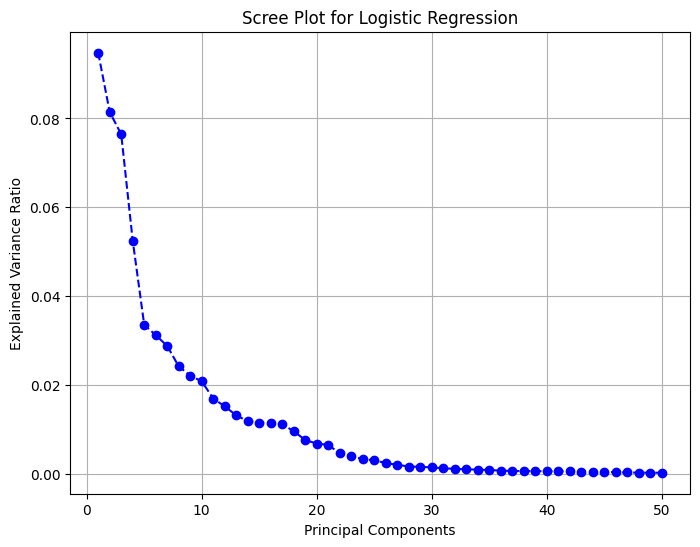

Training Random Forest...
Fitting 3 folds for each of 8 candidates, totalling 24 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:960: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 949, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 288, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 388, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_param_validation.py", line 216, in wrapper
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 1324,

Test F1 score for Random Forest: 1.0


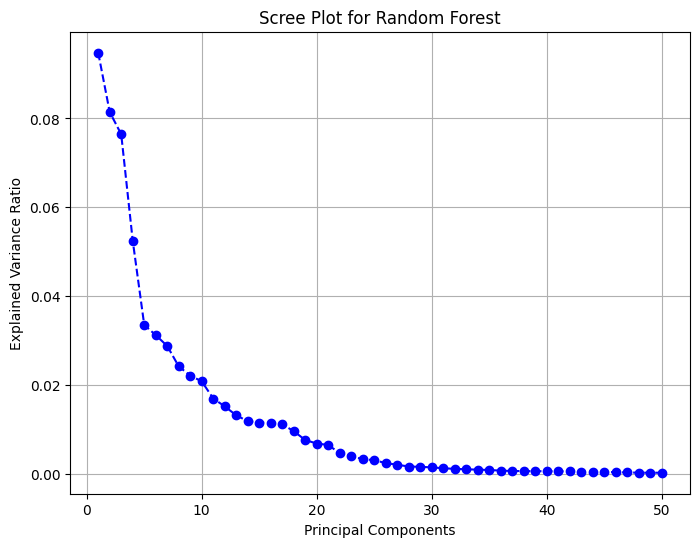

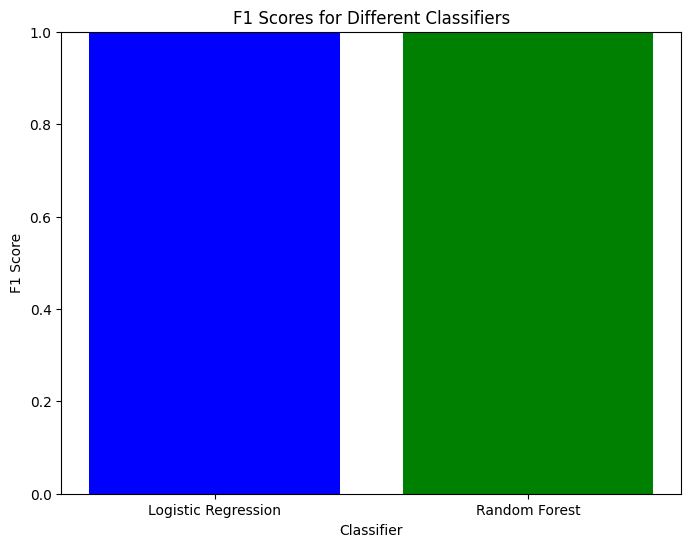

Experiment finished. Results logged to MLFlow.


In [72]:
#EXPERIMENT 5

import mlflow
import mlflow.sklearn
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA

df = pd.read_csv('Games.csv')

X = df.drop('Score', axis=1)
y = df['Score']

numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

classifiers = [
    ('Logistic Regression', LogisticRegression(max_iter=1000)),
    ('Random Forest', RandomForestClassifier())
]

results = {}

for name, classifier in classifiers:
    print(f"Training {name}...")

    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', classifier)
    ])

    if name == 'Logistic Regression':
        param_grid = {
            'classifier__C': [0.1, 1, 10],
            'classifier__penalty': ['l2']
        }
    elif name == 'Random Forest':
        param_grid = {
            'classifier__n_estimators': [50, 100],
            'classifier__max_depth': [None, 10],
            'classifier__min_samples_split': [2, 5]
        }

    grid_search = GridSearchCV(pipeline, param_grid, cv=3, scoring='f1', verbose=1)
    grid_search.fit(X_train, y_train)

    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)

    f1_test = f1_score(y_test, y_pred, average='macro')
    print(f"Test F1 score for {name}: {f1_test}")

    mlflow.log_metric(f'{name}_f1_test', f1_test)
    mlflow.log_param(f'{name}_best_params', grid_search.best_params_)

    results[name] = f1_test

    pca_pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('pca', PCA(n_components=50))
    ])

    X_train_pca = pca_pipeline.fit_transform(X_train)
    explained_variance = pca_pipeline.named_steps['pca'].explained_variance_ratio_

    plt.figure(figsize=(8, 6))
    plt.plot(np.arange(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--', color='b')
    plt.title(f'Scree Plot for {name}')
    plt.xlabel('Principal Components')
    plt.ylabel('Explained Variance Ratio')
    plt.grid(True)
    plt.show()

plt.figure(figsize=(8, 6))
plt.bar(results.keys(), results.values(), color=['blue', 'green'])
plt.title('F1 Scores for Different Classifiers')
plt.ylabel('F1 Score')
plt.xlabel('Classifier')
plt.ylim(0, 1)
plt.show()

print("Experiment finished. Results logged to MLFlow.")


In [73]:
import mlflow
if mlflow.active_run():
  mlflow.end_run()
mlflow.start_run()

<ActiveRun: >

In [74]:
!pip install --upgrade scikit-learn xgboost

In [75]:
#EXPERIMENT 6

import mlflow
import mlflow.sklearn
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, f1_score, confusion_matrix
from xgboost import XGBClassifier
import json

df = pd.read_csv("Games.csv")

X = df.drop('Score', axis=1)
y = df['Score']

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

classifiers = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
}

param_grids = {
    'Logistic Regression': {
        'classifier__C': [0.1, 1, 10],
        'classifier__penalty': ['l2', 'none']
    },
    'Random Forest': {
        'classifier__n_estimators': [50, 100, 200],
        'classifier__max_depth': [5, 10, 15],
        'classifier__min_samples_split': [2, 5, 10]
    },
    'XGBoost': {
        'classifier__n_estimators': [50, 100],
        'classifier__learning_rate': [0.01, 0.1, 0.2],
        'classifier__max_depth': [3, 6, 9]
    }
}

if mlflow.active_run():
    mlflow.end_run()

mlflow.start_run()
mlflow.log_param('dataset', 'Games.csv')
mlflow.log_param('num_samples', len(df))
mlflow.log_param('num_features', X.shape[1])

for clf_name, classifier in classifiers.items():
    try:
        print(f"Training {clf_name}...")

        pipeline = Pipeline(steps=[
            ('preprocessor', preprocessor),
            ('classifier', classifier)
        ])

        param_distributions = param_grids.get(clf_name, {})

        grid_search = RandomizedSearchCV(
            pipeline, param_distributions, cv=5, scoring='f1_weighted', n_iter=10, random_state=42
        )

        grid_search.fit(X_train, y_train)

        mlflow.log_param(f'{clf_name}_best_params', json.dumps(grid_search.best_params_))

        y_test_pred = grid_search.predict(X_test)

        f1_test = f1_score(y_test, y_test_pred, average='weighted')
        accuracy_test = grid_search.score(X_test, y_test)

        mlflow.log_metric(f'{clf_name}_f1_test', f1_test)
        mlflow.log_metric(f'{clf_name}_accuracy_test', accuracy_test)

        cm = confusion_matrix(y_test, y_test_pred)
        for i in range(cm.shape[0]):
            for j in range(cm.shape[1]):
                mlflow.log_metric(f'{clf_name}_cm_{i}_{j}', cm[i, j])

        report = classification_report(y_test, y_test_pred, output_dict=True)
        mlflow.log_text(json.dumps(report, indent=2), f'{clf_name}_classification_report.json')

    except Exception as e:
        print(f"Error training {clf_name}: {e}")
        mlflow.log_param(f'{clf_name}_error', str(e))

mlflow.end_run()

print("Experiment executed and logged in MLFlow.")

Training Logistic Regression...


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 6 is smaller than n_iter=10. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1389, in wr

Training Random Forest...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/u

Training XGBoost...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [22:20:20] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The XGBClassifier or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The XGBClassifier or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or o

Error training XGBoost: 'super' object has no attribute '__sklearn_tags__'
Experiment executed and logged in MLFlow.


/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The XGBClassifier or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The XGBClassifier or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags

In [76]:
import mlflow
if mlflow.active_run():
  mlflow.end_run()
mlflow.start_run()

<ActiveRun: >

In [77]:
#EXPERIMENT 7

import mlflow
import mlflow.sklearn
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import f1_score, accuracy_score
import json

df = pd.read_csv("Games.csv")

X = df.drop('Score', axis=1)
y = df['Score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

classifiers = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'SVM': SVC(random_state=42)
}

param_grids = {
    'Logistic Regression': {
        'classifier__C': [1, 10],
        'classifier__penalty': ['l2']
    },
    'Random Forest': {
        'classifier__n_estimators': [100],
        'classifier__max_depth': [10],
        'classifier__min_samples_split': [2]
    },
    'SVM': {
        'classifier__C': [1],
        'classifier__kernel': ['linear']
    }
}

with mlflow.start_run(nested=True):
    mlflow.log_param('dataset', 'Games.csv')
    mlflow.log_param('num_samples', len(df))
    mlflow.log_param('num_features', X.shape[1])

    for clf_name, classifier in classifiers.items():
        pipeline = Pipeline(steps=[
            ('preprocessor', preprocessor),
            ('classifier', classifier)
        ])

        mlflow.log_param(f'{clf_name}_classifier', clf_name)

        grid_search = GridSearchCV(pipeline, param_grids[clf_name], cv=3, scoring='f1_weighted', verbose=1, n_jobs=-1)

        grid_search.fit(X_train, y_train)

        mlflow.log_param(f'{clf_name}_best_params', json.dumps(grid_search.best_params_))

        y_test_pred = grid_search.predict(X_test)

        f1_test = f1_score(y_test, y_test_pred, average='weighted')
        accuracy_test = accuracy_score(y_test, y_test_pred)

        mlflow.log_metric(f'{clf_name}_f1_test', f1_test)
        mlflow.log_metric(f'{clf_name}_accuracy_test', accuracy_test)

print("Custom experiment executed and logged in MLFlow.")


Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Custom experiment executed and logged in MLFlow.


In [78]:
import mlflow
if mlflow.active_run():
  mlflow.end_run()
mlflow.start_run()

<ActiveRun: >

In [79]:
!pip install -U scikit-learn xgboost mlflow

In [81]:
import mlflow
import mlflow.sklearn
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import f1_score, accuracy_score
import json
import matplotlib.pyplot as plt

# End any existing runs
mlflow.end_run()

df = pd.read_csv("Games.csv")

X = df.drop('Score', axis=1)
y = df['Score']
y_mapped = y - y.min()

X_temp, X_test, y_temp, y_test = train_test_split(X, y_mapped, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

classifiers = {
    'Logistic_Regression': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', LogisticRegression(max_iter=1000, random_state=42))
    ]),
    'Random_Forest': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', RandomForestClassifier(random_state=42))
    ]),
    'Ridge_Classifier': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', RidgeClassifier(random_state=42))
    ]),
    'XGBoost': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', xgb.XGBClassifier(
            random_state=42,
            objective='multi:softprob',
            tree_method='hist',
            n_jobs=-1,
            callbacks=[xgb.callback.EarlyStopping(rounds=10)]
        ))
    ])
}

param_grids = {
    'Logistic_Regression': {'classifier__C': [1, 10]},
    'Random_Forest': {'classifier__n_estimators': [50], 'classifier__max_depth': [10]},
    'Ridge_Classifier': {'classifier__alpha': [0.1, 1.0]},
    'XGBoost': {
        'classifier__n_estimators': [50],
        'classifier__max_depth': [5],
        'classifier__learning_rate': [0.1]
    }
}

results = []

# Set up the experiment
mlflow.set_experiment("model_comparison_experiment")

try:
    with mlflow.start_run(run_name="main_run"):
        for clf_name, pipeline in classifiers.items():
            # Use nested runs for each classifier
            with mlflow.start_run(run_name=clf_name, nested=True):
                print(f"\nTraining {clf_name}...")
                mlflow.log_param('classifier', clf_name)

                grid_search = GridSearchCV(
                    pipeline,
                    param_grids[clf_name],
                    cv=2,
                    scoring='f1_weighted',
                    verbose=1,
                    n_jobs=-1
                )

                try:
                    if clf_name == 'XGBoost':
                        X_train_processed = pipeline.named_steps['preprocessor'].fit_transform(X_train)
                        X_val_processed = pipeline.named_steps['preprocessor'].transform(X_val)

                        classifier = pipeline.named_steps['classifier']
                        classifier.fit(
                            X_train_processed, y_train,
                            eval_set=[(X_val_processed, y_val)],
                            verbose=False
                        )

                        X_test_processed = pipeline.named_steps['preprocessor'].transform(X_test)
                        y_test_pred = classifier.predict(X_test_processed)
                    else:
                        grid_search.fit(X_train, y_train)
                        y_test_pred = grid_search.predict(X_test)
                        mlflow.log_params(grid_search.best_params_)

                    f1_test = f1_score(y_test, y_test_pred, average='weighted')
                    accuracy_test = accuracy_score(y_test, y_test_pred)

                    mlflow.log_metric('f1_score', f1_test)
                    mlflow.log_metric('accuracy', accuracy_test)

                    results.append({
                        'Classifier': clf_name.replace('_', ' '),
                        'F1 Score': f1_test,
                        'Accuracy': accuracy_test
                    })

                    print(f"{clf_name} - F1 Score: {f1_test:.4f}, Accuracy: {accuracy_test:.4f}")

                except Exception as e:
                    print(f"Error training {clf_name}: {str(e)}")
                    continue

        # Create and save the comparison plot
        results_df = pd.DataFrame(results)

        plt.figure(figsize=(12, 6))
        x = np.arange(len(results_df['Classifier']))
        width = 0.35

        plt.bar(x - width/2, results_df['F1 Score'], width, label='F1 Score', color='skyblue')
        plt.bar(x + width/2, results_df['Accuracy'], width, label='Accuracy', color='lightgreen')

        plt.title('Model Performance Comparison')
        plt.xlabel('Classifier')
        plt.ylabel('Score')
        plt.xticks(x, results_df['Classifier'], rotation=45)
        plt.legend()
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.tight_layout()

        plot_path = 'model_performance_comparison.png'
        plt.savefig(plot_path)
        plt.close()
        mlflow.log_artifact(plot_path)

        print("\nFinal Results:")
        print(results_df.to_string(index=False))

finally:
    mlflow.end_run()


Training Logistic_Regression...
Fitting 2 folds for each of 2 candidates, totalling 4 fits
Logistic_Regression - F1 Score: 1.0000, Accuracy: 1.0000

Training Random_Forest...
Fitting 2 folds for each of 1 candidates, totalling 2 fits
Random_Forest - F1 Score: 0.6070, Accuracy: 0.6981

Training Ridge_Classifier...
Fitting 2 folds for each of 2 candidates, totalling 4 fits
Ridge_Classifier - F1 Score: 1.0000, Accuracy: 1.0000

Training XGBoost...
XGBoost - F1 Score: 1.0000, Accuracy: 1.0000

Final Results:
         Classifier  F1 Score  Accuracy
Logistic Regression  1.000000  1.000000
      Random Forest  0.607003  0.698075
   Ridge Classifier  1.000000  1.000000
            XGBoost  1.000000  1.000000
